# Main Figures 7–10

Cyclone interaction, wind response, Hovmöller diagnostics, and coalescence counts. Each generated figure is displayed immediately after its plotting cell.


In [1]:
from __future__ import annotations
import hashlib, importlib.metadata, io, json, math, os, re, shutil, sys, zipfile
from contextlib import redirect_stderr, redirect_stdout
from dataclasses import dataclass
from pathlib import Path

os.environ.setdefault("MPLCONFIGDIR", "/tmp/james-mpl-cache")
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
from IPython.display import Image as NotebookImage, SVG, display
from matplotlib.colors import BoundaryNorm, ListedColormap
from scipy import ndimage
from scipy.integrate import cumulative_trapezoid, trapezoid
from scipy.interpolate import interp1d

try:
    import cartopy.crs as ccrs
    HAVE_CARTOPY = True
except ImportError:
    HAVE_CARTOPY = False
try:
    import wavebreaking as wb
    HAVE_WAVEBREAKING = True
except ImportError:
    HAVE_WAVEBREAKING = False
try:
    from contrack import contrack as ConTrack
    HAVE_CONTRACK = True
except ImportError:
    HAVE_CONTRACK = False

def find_repo_root(start=None):
    start = (start or Path.cwd()).resolve()
    for candidate in (start, *start.parents):
        if (candidate / "ready_version").is_dir() and (candidate / "derived_data").is_dir():
            return candidate
    raise FileNotFoundError("Run from the repository or one of its subdirectories")

ROOT = find_repo_root()
RAW_DIR = ROOT
DERIVED_DIR = ROOT / "derived_data"
PUBLICATION_DIR = ROOT / "publication_notebooks"
FIGURE_DIR = PUBLICATION_DIR / "outputs"
TABLE_DIR = PUBLICATION_DIR / "outputs"
SI_DIR = ROOT / "paper_revision" / "supplemental_analysis"
FIGURE_DIR.mkdir(parents=True, exist_ok=True)
RUN_HEAVY_PROCESSING = False
USE_PRECOMPUTED_DERIVED_DATA = True
SAVE_FIGURES = True
SHOW_FIGURES = False
REBUILD_FIGURES = os.environ.get(
    "PUBLICATION_REBUILD_FIGURES",
    os.environ.get("PUBLICATION_FULL_REBUILD", "1"),
) == "1"
FULL_REBUILD = REBUILD_FIGURES
EARTH_RADIUS_M = 6_371_229.0
EARTH_OMEGA = 7.2921e-5
GRAVITY = 9.80616
RD = 287.05
CP = 1004.0
KAPPA = RD / CP
mpl.rcParams.update({"figure.dpi": 120, "savefig.dpi": 300, "font.size": 11, "axes.titlesize": 12, "axes.labelsize": 11, "legend.fontsize": 9})

def show_docx_media(docx_relative_path, members):
    members = [members] if isinstance(members, str) else list(members)
    with zipfile.ZipFile(ROOT / docx_relative_path) as archive:
        for member in members:
            payload = archive.read(member)
            display(SVG(data=payload.decode("utf-8")) if member.lower().endswith(".svg") else NotebookImage(data=payload))

def show_files(paths):
    paths = [paths] if isinstance(paths, str) else list(paths)
    for relative_path in paths:
        path = ROOT / relative_path
        if path.exists() and path.suffix.lower() in {".png", ".jpg", ".jpeg"}:
            display(NotebookImage(filename=str(path)))

# Optional environment diagnostics are intentionally disabled in the public notebooks.
# print(f"Repository root: {ROOT.relative_to(ROOT)}")
# print(f"Rebuild figures: {REBUILD_FIGURES}")
# print(f"Cartopy={HAVE_CARTOPY}, WaveBreaking={HAVE_WAVEBREAKING}, ConTrack={HAVE_CONTRACK}")


In [2]:
B_VALUES=(1.0,1.5,2.0); N_VALUES=(1,3,6); S_VALUES=(-10,-5,0,5,10)
def case_stem(b,n,s):
    bt='15' if np.isclose(b,1.5) else str(int(b))
    return f'BCwave_b{bt}n{n}' + ('' if s==0 else f's{s}')
def experiment_manifest():
    rows=[]
    for b in B_VALUES:
      for n in N_VALUES:
       for s in S_VALUES:
        stem=case_stem(b,n,s)
        rows.append({'case':stem.replace('BCwave_',''),'b':b,'n':n,'s_deg':s,
          'raw_file':f'{stem}.nc',
          'coarse_file':f'derived_data/coarse5avg/{stem}.nc',
          'pv_file':f'derived_data/pv_isentropic/{stem}.nc'})
    return pd.DataFrame(rows)
TABLE1=experiment_manifest(); assert len(TABLE1)==45
TABLE1.to_csv(TABLE_DIR/'Table1_experiment_manifest.csv',index=False)
# Optional manifest preview is disabled to keep notebook output figure-only.
# display(TABLE1)


In [3]:
def open_case(case, coarse=False, chunks=None):
    stem=case if str(case).startswith('BCwave_') else f'BCwave_{case}'
    path=(DERIVED_DIR/'coarse5avg' if coarse else RAW_DIR)/f'{stem}.nc'
    if not path.exists(): raise FileNotFoundError(path)
    return xr.open_dataset(path,decode_times=False,chunks=chunks)
def standardize_latlon(obj):
    rename={}
    if 'grid_yt' in obj.dims or 'grid_yt' in obj.coords: rename['grid_yt']='latitude'
    if 'grid_xt' in obj.dims or 'grid_xt' in obj.coords: rename['grid_xt']='longitude'
    return obj.rename(rename)
def daily_mean(ds): return ds.coarsen(time=24,boundary='trim').mean()
def save_figure(fig,name):
    path=FIGURE_DIR/name
    if SAVE_FIGURES: fig.savefig(path,bbox_inches='tight',facecolor='white')
    if SHOW_FIGURES: plt.show()
    else: plt.close(fig)
    return path
def nearest_level(levels,target): return int(np.nanargmin(np.abs(np.asarray(levels)-target)))
def grid_cell_area(latitude,dlat_deg=1.,dlon_deg=1.):
    lat=np.deg2rad(np.asarray(latitude)); dlat=np.deg2rad(dlat_deg); dlon=np.deg2rad(dlon_deg)
    return EARTH_RADIUS_M**2*dlon*(np.sin(lat+dlat/2)-np.sin(lat-dlat/2))
def haversine_m(lat1,lon1,lat2,lon2):
    lat1,lon1,lat2,lon2=map(np.deg2rad,(lat1,lon1,lat2,lon2)); dlat=lat2-lat1; dlon=(lon2-lon1+np.pi)%(2*np.pi)-np.pi
    h=np.sin(dlat/2)**2+np.cos(lat1)*np.cos(lat2)*np.sin(dlon/2)**2
    return 2*EARTH_RADIUS_M*np.arcsin(np.minimum(1,np.sqrt(h)))
def relative_vorticity(u,v,latitude,longitude):
    lat=np.deg2rad(np.asarray(latitude,float)); lon=np.deg2rad(np.asarray(longitude,float)); coslat=np.cos(lat)
    dvdl=np.gradient(np.asarray(v,float),lon,axis=-1,edge_order=2)
    ducos=np.gradient(np.asarray(u,float)*coslat[...,None],lat,axis=-2,edge_order=2)
    with np.errstate(divide='ignore',invalid='ignore'): return (dvdl-ducos)/(EARTH_RADIUS_M*coslat[...,None])
def theta(T,p_hpa): return np.asarray(T)*(1000/np.asarray(p_hpa))**KAPPA
def pressure_pv(u,v,T,p_hpa,latitude,longitude):
    p=np.asarray(p_hpa,float)*100; zeta=relative_vorticity(u,v,latitude,longitude)
    coriolis=(2*EARTH_OMEGA*np.sin(np.deg2rad(latitude)))[None,:,None]
    dtheta_dp=np.gradient(theta(T,np.asarray(p_hpa)[:,None,None]),p,axis=0,edge_order=2)
    return -GRAVITY*(zeta+coriolis)*dtheta_dp*1e6
def area_weights(latitude):
    w=np.cos(np.deg2rad(latitude)); return w/w.sum()


## Figure 7


In [4]:
def plot_figure7():
    import xarray as xr
    import cartopy.crs as ccrs
    import matplotlib.pyplot as plt
    import matplotlib.ticker as mticker
    from matplotlib.ticker import FuncFormatter
    from matplotlib.path import Path
    import numpy as np
    scenarios = [{'file': str(RAW_DIR / 'BCwave_b2n3.nc'), 'label': 'b=2, n=3, s=0'}, {'file': str(RAW_DIR / 'BCwave_b2n3s10.nc'), 'label': 'b=2, n=3, s=+10'}, {'file': str(RAW_DIR / 'BCwave_b2n1s10.nc'), 'label': 'b=2, n=1, s=+10'}]
    days = [10, 12, 14]
    times = [d * 24 for d in days]
    letters = [chr(ord('a') + i) for i in range(9)]
    levels_omg = [-0.24, -0.2, -0.16, -0.08, -0.04, 0.04, 0.08, 0.16, 0.2, 0.24]
    levels_p = np.arange(800, 1060, 5) * 100
    levels_p = levels_p[levels_p != 1000 * 100]
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 18), dpi=300, subplot_kw={'projection': ccrs.NorthPolarStereo(central_longitude=0)})
    axes = axes.flatten()

    def make_lon_formatter(col):

        def fmt(x, pos):
            if x == -90 and col == 0:
                return '90°W'
            if x == 0:
                return '0°'
            if x == 90 and col == 2:
                return '90°E'
            if x == 180:
                return '180°'
            return ''
        return fmt
    for s_idx, scen in enumerate(scenarios):
        ds = xr.open_dataset(scen['file'], decode_times=False)
        for d_idx, (day, t_idx) in enumerate(zip(days, times)):
            ax = axes[s_idx * 3 + d_idx]
            col = d_idx
            letter = letters[s_idx * 3 + d_idx]
            press = ds['PRESsfc'].isel(time=t_idx)
            omg500 = ds['omg_plev'].sel(plev=500).isel(time=t_idx)
            omg500 = omg500.where(np.abs(omg500) >= 0.08, 0)
            ax.set_extent([-180, 180, 30, 90], ccrs.PlateCarree())
            theta = np.linspace(0, 2 * np.pi, 400)
            verts = np.column_stack([0.5 + 0.5 * np.cos(theta), 0.5 + 0.5 * np.sin(theta)])
            codes = np.full(len(theta), Path.LINETO, dtype=Path.code_type)
            codes[0], codes[-1] = (Path.MOVETO, Path.CLOSEPOLY)
            ax.set_boundary(Path(verts, codes), transform=ax.transAxes)
            gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linestyle='--', linewidth=0.5, color='gray', x_inline=False, y_inline=False, rotate_labels=False)
            lon_ticks = [-150, -120, -90, -60, -30, 0, 30, 60, 90, 120, 150, 180]
            gl.xlocator = mticker.FixedLocator(lon_ticks)
            gl.xformatter = FuncFormatter(make_lon_formatter(col))
            gl.xlabels_top = True
            gl.xlabels_bottom = False
            gl.ylabels_left = False
            gl.ylabels_right = False
            gl.xlabel_style = {'size': 12}
            cf = ax.contourf(omg500['grid_xt'], omg500['grid_yt'], omg500, transform=ccrs.PlateCarree(), cmap='RdBu_r', levels=levels_omg, extend='both', alpha=0.6)
            ax.contour(press['grid_xt'], press['grid_yt'], press, transform=ccrs.PlateCarree(), levels=levels_p, colors='black', linewidths=1.0, linestyles='solid')
            ax.set_title(f"({letter}) {scen['label']}, Day {day}", fontsize=24)
    "\ncbar = fig.colorbar(\n    cf, ax=axes.tolist(),\n    orientation='horizontal',\n    pad=0.04, fraction=0.04\n)\ncbar.set_label('500 hPa Vertical Velocity (Pa s⁻¹)', size=14)\n"
    plt.tight_layout()
    output = save_figure(fig, 'Figure7_pressure_contour_coalescence.png')
    return output


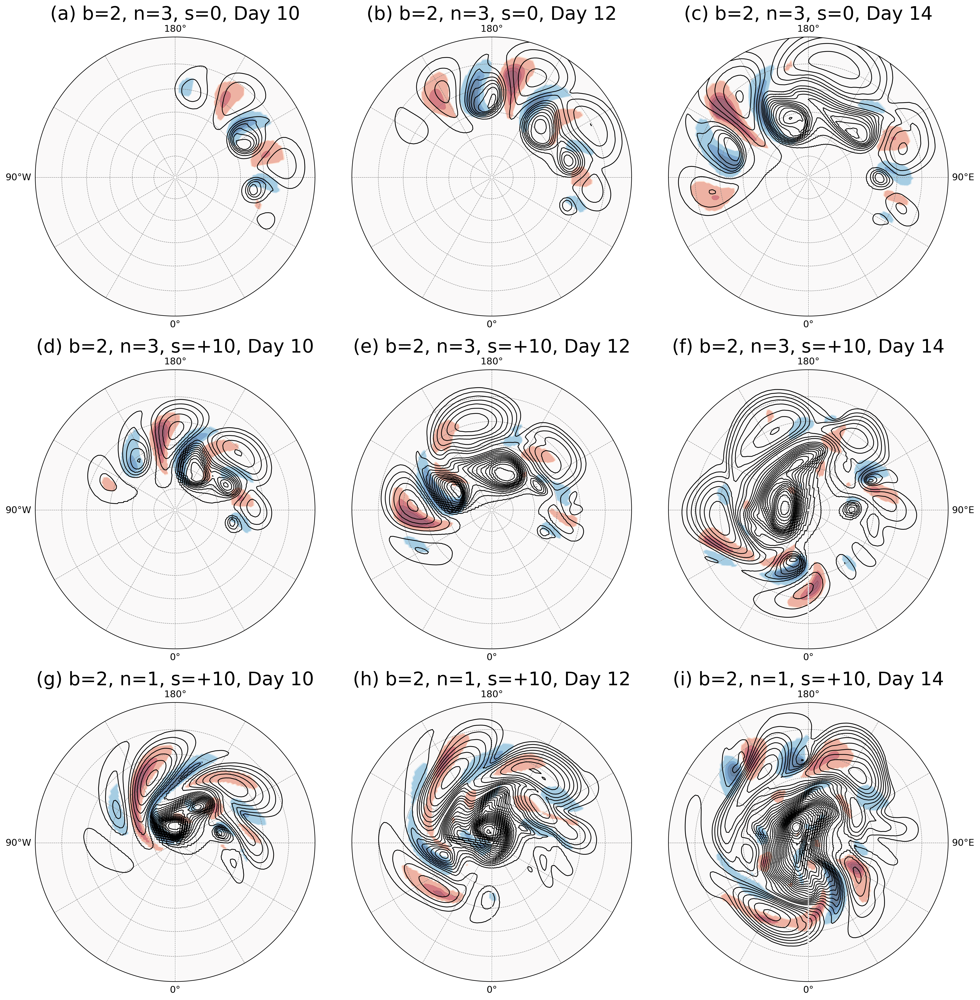

In [5]:
# Diagnostic stdout/stderr is hidden so saved notebook output contains only publication figures.
_diagnostic_output = io.StringIO()
_original_argv = sys.argv[:]
sys.argv = ['publication_notebook']
try:
    if REBUILD_FIGURES:
        with redirect_stdout(_diagnostic_output), redirect_stderr(_diagnostic_output):
            plot_figure7()
finally:
    sys.argv = _original_argv
show_files(['publication_notebooks/outputs/Figure7_pressure_contour_coalescence.png'])


## Figure 8


In [6]:
"""
Relative-time analysis (MAX wind) over union region: primary sub-id=1 ∪ first-merge partner sub-id=k_merge
Group by filename 'n' value and plot three figures for n=1,3,6.
- Window: ±27 h around the first merge
- Stat: regional MAX of 1000 hPa wind (from u_plev, v_plev)
- Binning for boxplots: every 6 hours
- Files scanned only in current directory (non-recursive): BCwave*.nc, *BCwave*.nc

Outputs:
  - BCwave_relative_union_wspd1000_±27h_max_n1.png
  - BCwave_relative_union_wspd1000_±27h_max_n3.png
  - BCwave_relative_union_wspd1000_±27h_max_n6.png
"""
import os, re, glob, warnings
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from scipy import ndimage
from contextlib import redirect_stdout, redirect_stderr
from contrack import contrack as ContrackClass
warnings.filterwarnings('ignore')

class _Silent:

    def __enter__(self):
        self._devnull = open(os.devnull, 'w')
        self._stdout = redirect_stdout(self._devnull)
        self._stderr = redirect_stderr(self._devnull)
        self._stdout.__enter__()
        self._stderr.__enter__()
        return self

    def __exit__(self, et, e, tb):
        self._stderr.__exit__(et, e, tb)
        self._stdout.__exit__(et, e, tb)
        self._devnull.close()
        return False

def _get_resolution_patched(self, name, force=False):
    arr = np.asarray(self.ds[name].values)
    if arr.size < 2:
        return np.nan
    if np.issubdtype(arr.dtype, np.datetime64) or np.issubdtype(arr.dtype, np.timedelta64):
        dt_s = (arr[1] - arr[0]).astype('timedelta64[s]').astype('int64')
        return float(dt_s) / 3600.0
    return float(abs(arr[1] - arr[0]))
ContrackClass._get_resolution = _get_resolution_patched

def parse_n(name: str):
    """
    Extract n from filename base, accepting only 1/3/6.
    Example matches: '...n1...', '...n3...', '...n6...'
    """
    m = re.search('n(\\d+)', name)
    if not m:
        return None
    val = int(m.group(1))
    return val if val in {1, 3, 6} else None

def open_and_normalize(nc_path: str) -> xr.Dataset:
    ds = xr.open_dataset(nc_path, decode_times=False)
    if 'grid_yt' in ds.dims:
        ds = ds.rename({'grid_yt': 'latitude'})
    if 'grid_xt' in ds.dims:
        ds = ds.rename({'grid_xt': 'longitude'})
    if 'latitude' in ds.dims and ds['latitude'][0] > ds['latitude'][-1]:
        ds = ds.sortby('latitude')
    if 'longitude' in ds:
        lon = ds['longitude'].values % 360.0
        ds = ds.assign_coords(longitude=('longitude', lon)).sortby('longitude')
    t = ds['time']
    if np.issubdtype(t.dtype, np.datetime64):
        pass
    elif np.issubdtype(t.dtype, np.timedelta64):
        base = np.datetime64('2000-01-01T00:00')
        ds = ds.assign_coords(time=base + t.astype('timedelta64[s]'))
    else:
        secs = np.rint(t.values.astype('float64') * 3600.0).astype('int64')
        base = np.datetime64('2000-01-01T00:00')
        ds = ds.assign_coords(time=base + secs.astype('timedelta64[s]'))
    return ds

def contrack_flag(nc_file, threshold_pa=99000.0, overlap=0.3, persistence=24):
    ds = open_and_normalize(nc_file)
    blk = ContrackClass()
    blk.ds = ds.copy()
    with _Silent():
        blk.run_contrack(variable='PRESsfc', threshold=float(threshold_pa), gorl='<=', overlap=overlap, persistence=persistence, twosided=False)
    flag = blk.ds['flag']
    if not np.issubdtype(flag.dtype, np.integer):
        flag = flag.fillna(0).astype(np.int32)
    return flag

def split_cyclones_by_time(flag3d: xr.DataArray, min_pixels=4) -> xr.DataArray:
    v = flag3d.values
    T, Ny, Nx = v.shape
    out = np.zeros_like(v, dtype=np.int32)
    st2d = np.ones((3, 3), dtype=int)
    nid = 1
    for t in range(T):
        sl = v[t]
        for eid in np.unique(sl):
            if eid <= 0:
                continue
            lbl, nlab = ndimage.label(sl == eid, structure=st2d)
            if nlab == 0:
                continue
            if min_pixels > 1:
                sizes = ndimage.sum(np.ones_like(lbl), labels=lbl, index=np.arange(1, nlab + 1))
                keep = {i + 1 for i, s in enumerate(sizes) if s >= min_pixels}
            else:
                keep = set(range(1, nlab + 1))
            for k in keep:
                out[t][lbl == k] = nid
                nid += 1
    return xr.DataArray(out, coords=flag3d.coords, dims=flag3d.dims, name='flag2d')

def track_subids(flag2d: xr.DataArray, match_thresh=0.3) -> xr.DataArray:
    v = flag2d.values
    T = v.shape[0]
    out = np.zeros_like(v, dtype=np.int32)
    nid = 1
    ids0 = np.unique(v[0])
    ids0 = ids0[ids0 > 0]
    for cid in ids0:
        out[0][v[0] == cid] = nid
        nid += 1

    def masks(frame):
        ids = np.unique(frame)
        ids = ids[ids > 0]
        return {cid: frame == cid for cid in ids}
    prev = masks(v[0])
    for t in range(1, T):
        curr = masks(v[t])
        for cid, cm in curr.items():
            a = int(cm.sum())
            best = None
            br = 0.0
            for pid, pm in prev.items():
                inter = int((cm & pm).sum())
                r = inter / float(a) if a > 0 else 0.0
                if r > br:
                    br = r
                    best = pid
            if best is not None and br >= match_thresh:
                sid_prev = np.unique(out[t - 1][prev[best]])
                sid_prev = int(sid_prev[sid_prev > 0][0]) if sid_prev.size > 0 else 0
                out[t][cm] = sid_prev
            else:
                out[t][cm] = nid
                nid += 1
        prev = curr
    return xr.DataArray(out, coords=flag2d.coords, dims=flag2d.dims, name='subid')

def find_first_merge_time_primary_any(subid3d: xr.DataArray, area_ratio_thresh=0.1, dilate_iters=1, wrap_lon=True, min_pixels=4):
    vals = subid3d.values
    T, Ny, Nx = vals.shape
    st2d = np.ones((3, 3), dtype=bool)

    def exists(mask):
        return bool(mask.sum() >= min_pixels)

    def dilate_wrap(mask):
        if not wrap_lon:
            return ndimage.binary_dilation(mask, structure=st2d, iterations=dilate_iters)
        tile = np.tile(mask, (1, 3))
        dil = ndimage.binary_dilation(tile, structure=st2d, iterations=dilate_iters)
        return dil[:, Nx:2 * Nx]
    for t in range(1, T):
        m1_prev = vals[t - 1] == 1
        m1_curr = vals[t] == 1
        ks = np.unique(vals[t - 1])
        ks = ks[ks >= 2]
        for k in ks:
            k_prev = vals[t - 1] == k
            k_curr = vals[t] == k
            if not exists(k_prev) or exists(k_curr):
                continue
            a2 = int(k_prev.sum())
            inter_forward = int((k_prev & m1_curr).sum())
            condA = a2 > 0 and inter_forward / float(a2) >= area_ratio_thresh
            condB = False
            union_prev = m1_prev | k_prev
            if union_prev.any():
                lbl, nlab = ndimage.label(union_prev, structure=st2d)
                for lab in range(1, nlab + 1):
                    comp = lbl == lab
                    if (comp & m1_prev).any() and (comp & k_prev).any():
                        condB = True
                        break
            condC = bool((dilate_wrap(m1_prev) & k_prev).any())
            if condA or condB or condC:
                return (t, int(k))
    return (None, None)

def select_plev_index(da: xr.DataArray, target_hpa=1000.0, level_names=('plev', 'level', 'lev', 'pressure', 'isobaricInhPa')):
    lev_name = None
    for nm in level_names:
        if nm in da.dims or nm in da.coords:
            lev_name = nm
            break
    if lev_name is None:
        raise RuntimeError(f'No pressure-level dimension found among {level_names} for {da.name}')
    lev = da.coords[lev_name].values
    if np.nanmax(lev) > 2000:
        target = target_hpa * 100.0
        tol = 7500.0
    else:
        target = target_hpa
        tol = 75.0
    idx = int(np.nanargmin(np.abs(lev - target)))
    if np.abs(float(lev[idx]) - target) > tol:
        raise RuntimeError(f'Nearest level {lev[idx]} too far from target {target} for {da.name}')
    return (lev_name, idx)

def windspeed_1000hpa(ds: xr.Dataset, u_name='u_plev', v_name='v_plev', target_hpa=1000.0) -> xr.DataArray:
    if u_name not in ds or v_name not in ds:
        raise RuntimeError(f'Missing {u_name} or {v_name} in dataset.')
    U = ds[u_name]
    V = ds[v_name]
    lev_u, iu = select_plev_index(U, target_hpa=target_hpa)
    lev_v, iv = select_plev_index(V, target_hpa=target_hpa)
    lev_name, idx = (lev_u, iu)
    U1000 = U.isel({lev_name: idx})
    V1000 = V.isel({lev_name: idx})
    W = xr.apply_ufunc(lambda a, b: np.sqrt(a * a + b * b), U1000, V1000, dask='parallelized', output_dtypes=[U1000.dtype])
    W.name = 'WSPD1000'
    return W

def region_max(field2d: xr.DataArray, mask2d: np.ndarray) -> float:
    m = mask2d.astype(bool)
    if not m.any():
        return np.nan
    vals = field2d.values[m]
    if vals.size == 0:
        return np.nan
    return float(np.nanmax(vals))

def union_wspd_series_rel(subid3d: xr.DataArray, wspd3d: xr.DataArray, t_merge: int, k_merge: int, window_h: int=27):
    if t_merge is None or k_merge is None:
        return (None, None)
    T = subid3d.sizes['time']
    i0 = max(0, t_merge - window_h)
    i1 = min(T - 1, t_merge + window_h)
    idx = np.arange(i0, i1 + 1, dtype=int)
    rel_hours = (idx - t_merge).astype(int)
    series = np.full(len(idx), np.nan, dtype=float)
    for j, k in enumerate(idx):
        mask_union = (subid3d.isel(time=k).values == 1) | (subid3d.isel(time=k).values == k_merge)
        wk = wspd3d.isel(time=k)
        series[j] = region_max(wk, mask_union)
    return (rel_hours, series)

def collect_all_series_rel_by_n(base_patterns=('BCwave*.nc', '*BCwave*.nc'), u_name='u_plev', v_name='v_plev', overlap=0.3, persistence=24, min_pixels=4, match_thresh=0.3, area_ratio_thresh=0.1, dilate_iters=1, window_h=27, target_hpa=1000.0):
    files = sorted({p for pat in base_patterns for p in glob.glob(pat)})
    buckets = {1: [], 3: [], 6: []}
    for f in files:
        base = os.path.basename(f)
        n_val = parse_n(os.path.splitext(base)[0])
        if n_val not in buckets:
            continue
        try:
            flag = contrack_flag(f, threshold_pa=99000.0, overlap=overlap, persistence=persistence)
            flag2d = split_cyclones_by_time(flag, min_pixels=min_pixels)
            subid3d = track_subids(flag2d, match_thresh=match_thresh)
            t_merge, k_merge = find_first_merge_time_primary_any(subid3d, area_ratio_thresh=area_ratio_thresh, dilate_iters=dilate_iters, wrap_lon=True, min_pixels=min_pixels)
            if t_merge is None or k_merge is None:
                print(f'  -> Skip (no merge): {base}')
                continue
            ds = open_and_normalize(f)
            wspd = windspeed_1000hpa(ds, u_name=u_name, v_name=v_name, target_hpa=target_hpa)
            rel_h, ser = union_wspd_series_rel(subid3d, wspd, t_merge, k_merge, window_h=window_h)
            if rel_h is None:
                print(f'  -> Skip (series build failed): {base}')
                continue
            buckets[n_val].append((rel_h, ser, base))
        except Exception as e:
            print(f'  !! Error on {base}: {e}')
    return buckets

def bin_6h_stats(all_lines, window_h=27):
    edges = np.array([-27, -21, -15, -9, -3, 3, 9, 15, 21, 27], dtype=int)
    centers = (edges[:-1] + edges[1:]) / 2.0
    groups = [[] for _ in range(len(centers))]
    for rel_h, ser, _ in all_lines:
        for t, val in zip(rel_h, ser):
            for bi in range(len(centers)):
                lo, hi = (edges[bi], edges[bi + 1])
                if t >= lo and (t < hi or (bi == len(centers) - 1 and t <= hi)):
                    if np.isfinite(val):
                        groups[bi].append(float(val))
                    break
    stats = []
    for vals in groups:
        a = np.array(vals, dtype=float)
        if a.size == 0:
            stats.append({'mean': np.nan, 'q1': np.nan, 'q2': np.nan, 'q3': np.nan, 'min': np.nan, 'max': np.nan, 'n': 0})
        else:
            stats.append({'mean': float(np.nanmean(a)), 'q1': float(np.nanpercentile(a, 25)), 'q2': float(np.nanpercentile(a, 50)), 'q3': float(np.nanpercentile(a, 75)), 'min': float(np.nanmin(a)), 'max': float(np.nanmax(a)), 'n': int(a.size)})
    return (centers, groups, stats)

def plot_relative_lines_and_boxes(all_lines, centers, groups, stats, out_png, n_label):
    fig, ax = plt.subplots(1, 1, figsize=(10.4, 6.0), dpi=130)
    for rel_h, ser, name in all_lines:
        ax.plot(rel_h, ser, lw=1.0, alpha=0.35)
    ax.set_xlabel('Relative time since merge (hours)')
    ax.set_ylabel('Max 1000 hPa wind speed (m s$^{-1}$)')
    ax.set_title(f'Union-region MAX 1000 hPa wind vs relative time (±27 h) — n={n_label}')
    bp = ax.boxplot(groups, positions=centers, widths=4.5, manage_ticks=False, whis=[0, 100], showmeans=True, meanline=False, patch_artist=True)
    for box in bp['boxes']:
        box.set(facecolor='#cccccc', alpha=0.45, edgecolor='#555555')
    for whisker in bp['whiskers']:
        whisker.set(color='#555555', linewidth=1.2)
    for cap in bp['caps']:
        cap.set(color='#555555', linewidth=1.2)
    for median in bp['medians']:
        median.set(color='#000000', linewidth=1.4)
    for meanp in bp['means']:
        meanp.set(marker='o', markerfacecolor='white', markeredgecolor='#222222', markersize=5, linestyle='None')
    ax.grid(True, alpha=0.3)
    ax.set_xlim(-27, 27)
    ax.set_xticks(np.arange(-27, 28, 3))
    plt.tight_layout()
    plt.savefig(out_png, bbox_inches='tight', dpi=160)
    plt.show()
    print(f'[Saved] {out_png}')

def main():
    buckets = collect_all_series_rel_by_n(base_patterns=('BCwave*.nc', '*BCwave*.nc'), u_name='u_plev', v_name='v_plev', overlap=0.3, persistence=24, min_pixels=4, match_thresh=0.3, area_ratio_thresh=0.1, dilate_iters=1, window_h=27, target_hpa=1000.0)
    for n_val in (1, 3, 6):
        lines = buckets.get(n_val, [])
        if not lines:
            print(f'[n={n_val}] No valid series. Skipped.')
            continue
        centers, groups, stats = bin_6h_stats(lines, window_h=27)
        out_png = f'BCwave_relative_union_wspd1000_±27h_max_n{n_val}.png'
        plot_relative_lines_and_boxes(lines, centers, groups, stats, out_png, n_val)

# Consolidated from paper_revision/figure_updates/rebuild_figure8_right_panels.py
REPO_ROOT = ROOT
__file__ = str(ROOT / 'paper_revision/figure_updates/rebuild_figure8_right_panels.py')

"""Rebuild Figure 8 right-hand panels from the original analysis notebook code."""
import json
import pickle
import re
import zipfile
from pathlib import Path
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
ROOT = Path(__file__).resolve().parents[2]
NOTEBOOK = ROOT / 'analysis_notebooks' / 'merger' / 'pri_cyclone_merger.ipynb'
MANUSCRIPT = ROOT / 'current_version' / 'AGU_Manuscript_FV3_Mingfei.docx'
OUTDIR = ROOT / 'current_version' / 'updated_figures'

def parse_b(filename: str) -> float:
    match = re.search('b(15|1|2)n', filename)
    if not match:
        raise ValueError(filename)
    return {'1': 1.0, '15': 1.5, '2': 2.0}[match.group(1)]

def parse_s(filename: str) -> int:
    match = re.search('s(-?\\d+)', filename)
    return int(match.group(1)) if match else 0

def summarize_records(records):
    edges = np.arange(-27, 27 + 1e-06, 6, dtype=float)
    centers = (edges[:-1] + edges[1:]) / 2.0
    per_case = []
    for rel_h, series, _ in records:
        rel_h = np.asarray(rel_h)
        series = np.asarray(series)
        values = np.full(centers.shape, np.nan, dtype=float)
        indices = np.digitize(rel_h, edges) - 1
        for index in range(len(centers)):
            selected = indices == index
            if np.any(selected):
                values[index] = np.nanmean(series[selected])
        per_case.append(values)
    if not per_case:
        return (centers, np.full_like(centers, np.nan), np.full_like(centers, np.nan), np.nan)
    per_case = np.vstack(per_case)
    mean_value = np.nanmean(per_case, axis=0)
    std_value = np.nanstd(per_case, axis=0, ddof=1)
    overall_mean = float(np.nanmean(per_case))
    return (centers, mean_value, std_value, overall_mean)

def regroup_records(buckets_n: dict) -> tuple[dict, dict]:
    buckets_b = {1.0: [], 1.5: [], 2.0: []}
    buckets_s = {-10: [], 0: [], 10: []}
    for records in buckets_n.values():
        for record in records:
            filename = record[2]
            buckets_b[parse_b(filename)].append(record)
            shift = parse_s(filename)
            if shift in buckets_s:
                buckets_s[shift].append(record)
    return (buckets_b, buckets_s)

def draw_group(axis, buckets, keys, colors, labels, summarize):
    for key in keys:
        if not buckets.get(key):
            continue
        centers, mean_value, std_value, overall_mean = summarize(buckets[key])
        finite = np.isfinite(centers) & np.isfinite(mean_value)
        band = finite & np.isfinite(std_value)
        axis.fill_between(centers[band], (mean_value - 0.5 * std_value)[band], (mean_value + 0.5 * std_value)[band], color=colors[key], alpha=0.2, linewidth=0)
        axis.plot(centers[finite], mean_value[finite], color=colors[key], linewidth=2.0, label=labels[key])
        if np.isfinite(overall_mean):
            axis.hlines(overall_mean, -24, 24, color=colors[key], linestyle='--', linewidth=1.7)

def build_separate_panel(buckets, keys, colors, labels, summarize, filename):
    fig, axis = plt.subplots(1, 1, figsize=(10, 5), dpi=300)
    fig.subplots_adjust(left=0.14, right=0.975, top=0.96, bottom=0.2)
    draw_group(axis, buckets, keys, colors, labels, summarize)
    axis.axvline(0, color='black', linewidth=1.5)
    axis.set_xlim(-24, 24)
    axis.set_xticks([-24, -12, 0, 12, 24])
    axis.set_ylim(28, 57)
    axis.set_yticks([30, 35, 40, 45, 50, 55])
    axis.set_xlabel('Relative time since pressure connection (hours)', fontsize=18)
    axis.set_ylabel('Wind speed (m s$^{-1}$)', fontsize=18)
    axis.tick_params(labelsize=16, width=1.0, length=5)
    axis.grid(True, alpha=0.28, linewidth=0.8)
    axis.legend(frameon=False, loc='upper left', fontsize=16, handlelength=2.5)
    for spine in axis.spines.values():
        spine.set_linewidth(1.1)
    output = OUTDIR / filename
    fig.savefig(output, dpi=300, facecolor='white')
    plt.close(fig)
    return output

def build_separate_panels(buckets_n, buckets_b, buckets_s):
    gray, orange, purple = ('#7f7f7f', '#ff7f0e', '#9467bd')
    top = build_separate_panel(buckets_s, (-10, 0, 10), {-10: gray, 0: orange, 10: purple}, {-10: 's = -10 (equatorward)', 0: 's = 0 (unshifted)', 10: 's = 10 (poleward)'}, summarize_records, 'Figure8_top_s_panel.png')
    middle = build_separate_panel(buckets_n, (1, 3, 6), {1: gray, 3: orange, 6: purple}, {1: 'n=1 (broad jet)', 3: 'n=3 (moderate)', 6: 'n=6 (narrow jet)'}, summarize_records, 'Figure8_middle_n_panel.png')
    bottom = build_separate_panel(buckets_b, (1.0, 1.5, 2.0), {1.0: gray, 1.5: orange, 2.0: purple}, {1.0: 'b=1', 1.5: 'b=1.5', 2.0: 'b=2'}, summarize_records, 'Figure8_bottom_b_panel.png')
    return (top, middle, bottom)

def build_right_panels(buckets_n, buckets_b, buckets_s) -> Path:
    colors = {'gray': '#7f7f7f', 'orange': '#ff7f0e', 'purple': '#9467bd'}
    fig, axes = plt.subplots(3, 1, figsize=(5.04, 5.892), dpi=250)
    fig.subplots_adjust(left=0.13, right=0.992, top=0.994, bottom=0.115, hspace=0.145)
    draw_group(axes[0], buckets_s, (-10, 0, 10), {-10: colors['gray'], 0: colors['orange'], 10: colors['purple']}, {-10: 's = -10 (equatorward)', 0: 's = 0 (unshifted)', 10: 's = 10 (poleward)'}, summarize_records)
    draw_group(axes[1], buckets_n, (1, 3, 6), {1: colors['gray'], 3: colors['orange'], 6: colors['purple']}, {1: 'n=1 (broad jet)', 3: 'n=3 (moderate)', 6: 'n=6 (narrow jet)'}, summarize_records)
    draw_group(axes[2], buckets_b, (1.0, 1.5, 2.0), {1.0: colors['gray'], 1.5: colors['orange'], 2.0: colors['purple']}, {1.0: 'b=1', 1.5: 'b=1.5', 2.0: 'b=2'}, summarize_records)
    for axis in axes:
        axis.axvline(0, color='black', linewidth=1.1)
        axis.set_xlim(-24, 24)
        axis.set_xticks([-24, -12, 0, 12, 24])
        axis.set_ylim(28, 57)
        axis.set_yticks([30, 35, 40, 45, 50, 55])
        axis.set_ylabel('Wind speed\n(m s$^{-1}$)', fontsize=10.5)
        axis.tick_params(labelsize=9.5, width=0.8, length=3)
        axis.grid(True, alpha=0.28, linewidth=0.6)
        axis.legend(frameon=False, loc='upper left', fontsize=8.1, handlelength=2.2)
        for spine in axis.spines.values():
            spine.set_linewidth(0.9)
    fig.supxlabel('Relative time since pressure connection (hours)', fontsize=10.5, y=0.025)
    output = OUTDIR / 'Figure8_right_panels_corrected.png'
    fig.savefig(output, dpi=250, facecolor='white')
    plt.close(fig)
    return output

def build_full_figure(right_panels: Path) -> Path:
    with zipfile.ZipFile(MANUSCRIPT) as archive:
        original = Image.open(archive.open('word/media/image13.png')).convert('RGB')
    replacement = Image.open(right_panels).convert('RGB')
    replace_x = 1290
    replacement = replacement.resize((original.width - replace_x, original.height), Image.Resampling.LANCZOS)
    original.paste(replacement, (replace_x, 0))
    output = OUTDIR / 'Figure8_corrected.png'
    original.save(output, dpi=(300, 300))
    return output

def plot_figure8_original() -> None:
    OUTDIR.mkdir(parents=True, exist_ok=True)
    cache = OUTDIR / 'figure8_event_series.pkl'
    if cache.exists():
        with cache.open('rb') as handle:
            buckets_n = pickle.load(handle)
    else:
        buckets_n = collect_all_series_rel_by_n(base_patterns=('BCwave*.nc', '*BCwave*.nc'), window_h=27)
        with cache.open('wb') as handle:
            pickle.dump(buckets_n, handle)
    buckets_b, buckets_s = regroup_records(buckets_n)
    separate_panels = build_separate_panels(buckets_n, buckets_b, buckets_s)
    right_panels = build_right_panels(buckets_n, buckets_b, buckets_s)
    full_figure = build_full_figure(right_panels)
    for panel in separate_panels:
        print(panel)
    print(right_panels)
    print(full_figure)

def plot_figure8():
    plot_figure8_original()
    source = ROOT / 'current_version/updated_figures/Figure8_corrected.png'
    output = FIGURE_DIR / 'Figure8_wind_and_pressure_coalescence.png'
    shutil.copy2(source, output)
    return output


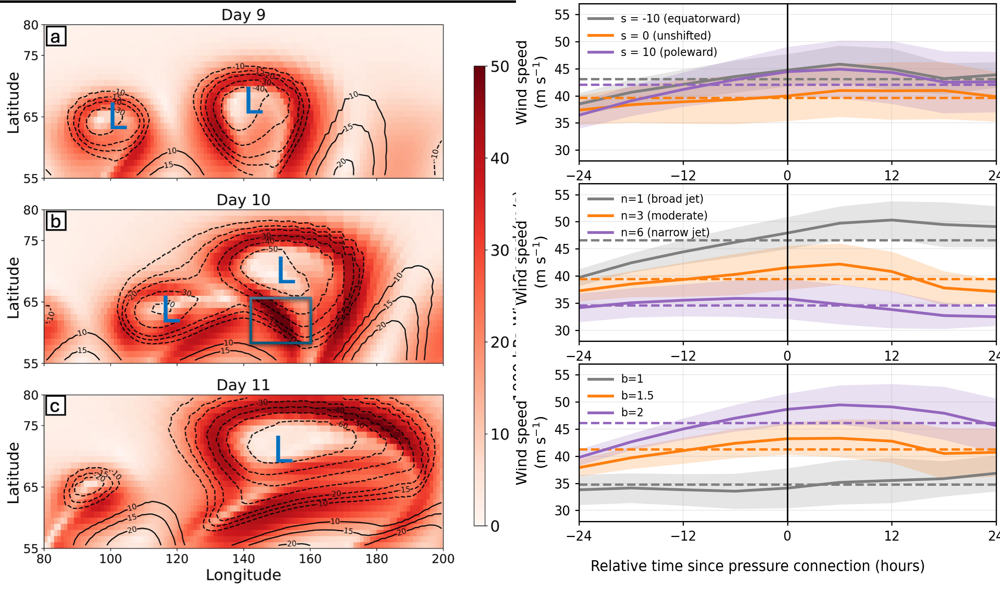

In [7]:
# Diagnostic stdout/stderr is hidden so saved notebook output contains only publication figures.
_diagnostic_output = io.StringIO()
_original_argv = sys.argv[:]
sys.argv = ['publication_notebook']
try:
    if REBUILD_FIGURES:
        with redirect_stdout(_diagnostic_output), redirect_stderr(_diagnostic_output):
            plot_figure8()
finally:
    sys.argv = _original_argv
show_files(['publication_notebooks/outputs/Figure8_wind_and_pressure_coalescence.png'])


## Figure 9


In [8]:
def plot_figure9():
    import xarray as xr
    import numpy as np
    import matplotlib.pyplot as plt
    import os
    from matplotlib.colors import BoundaryNorm, ListedColormap
    data_folder = str(RAW_DIR)
    file_paths = [os.path.join(data_folder, f) for f in os.listdir(data_folder) if f.endswith('.nc')]
    boundaries = [970, 976, 982, 988, 994, 1006, 1012, 1018, 1024, 1030]
    base_cmap = plt.get_cmap('coolwarm', len(boundaries) - 1)
    norm = BoundaryNorm(boundaries, ncolors=base_cmap.N, clip=True)
    colors = base_cmap(np.arange(base_cmap.N))
    idx_white = np.searchsorted(boundaries, 1000) - 1
    colors[idx_white] = [1, 1, 1, 1]
    cmap = ListedColormap(colors)
    letters = [chr(ord('a') + k) for k in range(9)]
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(16, 12), sharex=True, sharey=True)
    for i, n in enumerate([6, 3, 1]):
        for j, b in enumerate([2, 15, 1]):
            ax = axes[j, i]
            ds = xr.open_dataset(os.path.join(data_folder, f'BCwave_b{b}n{n}.nc'), decode_times=False)
            pres_region = ds['PRESsfc'].sel(grid_yt=slice(50, 90))
            lat = pres_region['grid_yt']
            w = np.cos(np.deg2rad(lat))
            w_norm = w / w.sum(dim='grid_yt')
            pres_avg = (pres_region * w_norm).sum(dim='grid_yt') / 100
            time = ds['time'].values
            lon = ds['grid_xt'].values
            data = pres_avg.isel(time=slice(200, None))
            im = ax.imshow(data, aspect='auto', extent=[lon.min(), lon.max(), time[200], time[-1]], cmap=cmap, norm=norm, origin='lower', interpolation='none')
            idx = j * 3 + i
            if b == 15:
                bb = 1.5
            else:
                bb = b
            ax.set_title(f'({letters[idx]})  b={bb}, n={n}', fontsize=18, fontweight='bold', loc='center')
            if b == 1 and n == 3:
                ax.set_xlabel('Longitude', fontsize=18)
            if n == 6 and b == 15:
                ax.set_ylabel('Time', fontsize=18)
            ax.set_xticks([0, 90, 180, 270, 360])
            ax.set_yticks([200, 250, 300, 350])
            ax.tick_params(axis='both', labelsize=18)
            ax.grid(True)
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    cbar = fig.colorbar(im, cax=cbar_ax, boundaries=boundaries, ticks=boundaries, spacing='proportional')
    cbar.set_label('Average PRESsfc (hPa)', fontsize=18)
    cbar.ax.tick_params(labelsize=16)
    plt.tight_layout(rect=[0.05, 0.05, 0.9, 0.95])
    return save_figure(fig, 'Figure9_cyclone_hovmoller.png')


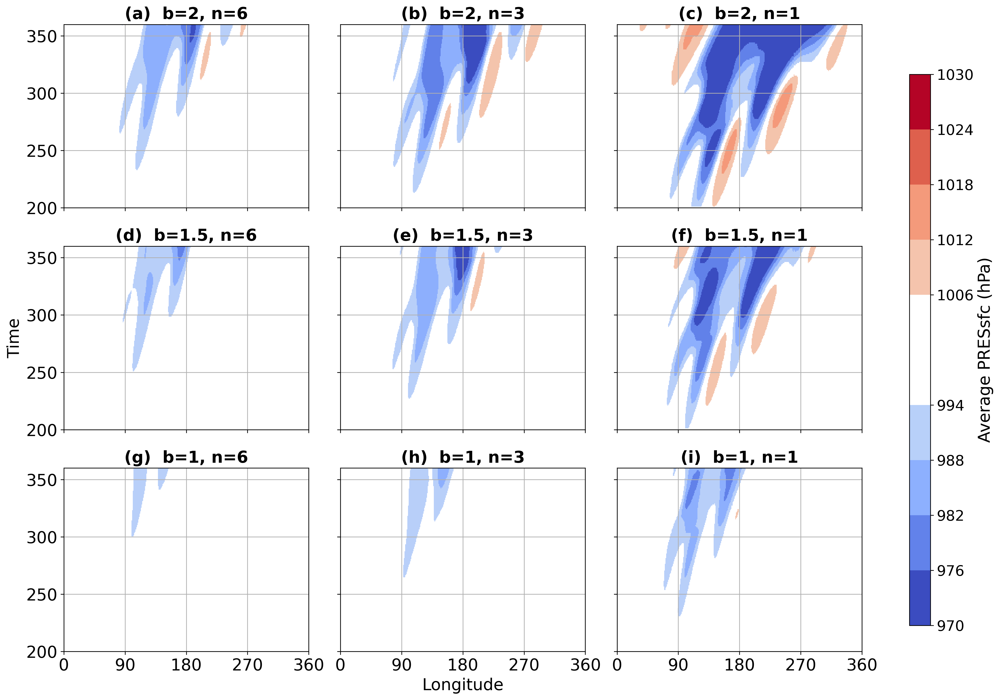

In [9]:
# Diagnostic stdout/stderr is hidden so saved notebook output contains only publication figures.
_diagnostic_output = io.StringIO()
_original_argv = sys.argv[:]
sys.argv = ['publication_notebook']
try:
    if REBUILD_FIGURES:
        with redirect_stdout(_diagnostic_output), redirect_stderr(_diagnostic_output):
            plot_figure9()
finally:
    sys.argv = _original_argv
show_files(['publication_notebooks/outputs/Figure9_cyclone_hovmoller.png'])


## Figure 10


In [10]:
FIGURE10_COUNTS = {
    "b15n1": 3, "b15n1s-10": 2, "b15n1s-5": 3, "b15n1s10": 10, "b15n1s5": 8,
    "b15n3": 2, "b15n3s-10": 0, "b15n3s-5": 2, "b15n3s10": 4, "b15n3s5": 3,
    "b15n6": 2, "b15n6s-10": 0, "b15n6s-5": 1, "b15n6s10": 2, "b15n6s5": 2,
    "b1n1": 2, "b1n1s-10": 2, "b1n1s-5": 2, "b1n1s10": 7, "b1n1s5": 5,
    "b1n3": 2, "b1n3s-10": 0, "b1n3s-5": 0, "b1n3s10": 3, "b1n3s5": 2,
    "b1n6": 1, "b1n6s-10": 0, "b1n6s-5": 0, "b1n6s10": 2, "b1n6s5": 2,
    "b2n1": 4, "b2n1s-10": 2, "b2n1s-5": 3, "b2n1s10": 19, "b2n1s5": 8,
    "b2n3": 2, "b2n3s-10": 0, "b2n3s-5": 2, "b2n3s10": 5, "b2n3s5": 4,
    "b2n6": 2, "b2n6s-10": 0, "b2n6s-5": 1, "b2n6s10": 4, "b2n6s5": 2,
}

def figure10_table():
    rows = []
    pattern = re.compile(r"b(15|1|2)n(1|3|6)(?:s(-?\d+))?")
    for case, count in FIGURE10_COUNTS.items():
        match = pattern.fullmatch(case)
        rows.append({
            "case": case,
            "b": 1.5 if match.group(1) == "15" else float(match.group(1)),
            "n": int(match.group(2)),
            "s": int(match.group(3) or 0),
            "mergers": count,
        })
    return pd.DataFrame(rows)

def plot_figure10():
    from matplotlib.colors import LinearSegmentedColormap
    data = figure10_table()
    b_levels = [1.0, 1.5, 2.0]
    n_levels = [6, 3, 1]
    s_levels = [-10, -5, 0, 5, 10]
    figure, axes = plt.subplots(2, 3, figsize=(18, 10), dpi=150)
    axes = axes.ravel()
    labels = ["(a)", "(b)", "(c)", "(d)", "(e)"]
    color_map = LinearSegmentedColormap.from_list("red_only", ["white", "red"])
    for index, shift in enumerate(s_levels):
        axis = axes[index]
        matrix = data[data.s == shift].pivot(index="b", columns="n", values="mergers").reindex(index=b_levels, columns=n_levels)
        axis.imshow(matrix.values, origin="lower", cmap=color_map, vmin=0, vmax=20, aspect="equal")
        axis.set_xticks(np.arange(3), [str(value) for value in n_levels])
        axis.set_yticks(np.arange(3), [str(value) for value in b_levels])
        axis.tick_params(labelsize=20)
        axis.set_xlabel("n (wider jet →)", fontsize=22)
        axis.set_ylabel("b (larger b →)", fontsize=22)
        axis.set_title(f"{labels[index]}  s = {shift}°", fontsize=24)
        for row in range(3):
            for column in range(3):
                axis.text(column, row, f"{int(matrix.values[row, column])}", ha="center", va="center", fontsize=22)
    axes[-1].axis("off")
    data.to_csv(TABLE_DIR / "Figure10_coalescence_event_counts.csv", index=False)
    figure.tight_layout()
    return save_figure(figure, "Figure10_coalescence_event_counts.png")


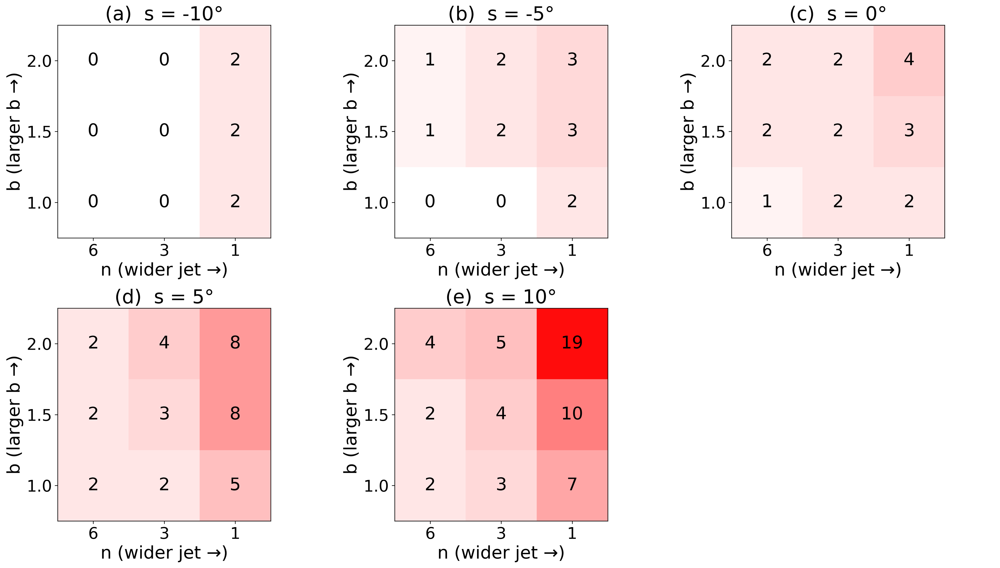

In [11]:
# Diagnostic stdout/stderr is hidden so saved notebook output contains only publication figures.
_diagnostic_output = io.StringIO()
_original_argv = sys.argv[:]
sys.argv = ['publication_notebook']
try:
    if REBUILD_FIGURES:
        with redirect_stdout(_diagnostic_output), redirect_stderr(_diagnostic_output):
            plot_figure10()
finally:
    sys.argv = _original_argv
show_files(['publication_notebooks/outputs/Figure10_coalescence_event_counts.png'])
